In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import pickle
from scipy.signal import correlate, correlation_lags

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
plt.rcParams['figure.figsize'] = (16,9)
plt.rcParams['figure.dpi'] = 300

In [ ]:
with open('./msc06_dict.pkl', 'rb') as f:
    msc06_dict = pickle.load(f)

In [ ]:
msc06_dict.keys()

dict_keys(['msc06_p199_0', 'msc06_p199_1', 'msc06_p199_2', 'msc06_p198_0', 'msc06_p198_1', 'msc06_p198_2', 'msc06_p190_0', 'msc06_p190_1', 'msc06_p190_2', 'msc06_p187_0', 'msc06_p187_1', 'msc06_p187_2', 'msc06_p125_0', 'msc06_p125_1', 'msc06_p125_2', 'msc06_p36_0', 'msc06_p36_1', 'msc06_p36_2'])

In [ ]:
minimum = 200
for k in msc06_dict.keys():
    n = len(msc06_dict[k])
    if (n < minimum) & (n > 5):
        minimum = len(msc06_dict[k])

In [ ]:
# because group with lowest number has 6, we choose 6 elements from each group at random
np.random.seed(54)
vox_choices_msc06_s1 = {}
sess = "01"
vidx_choices_msc06 = {}
for k in msc06_dict.keys():

    p = k.split("_")
    parc = pd.read_csv("./voxels/"+p[0]+"_sess"+sess+"_ind_parc_"+p[1]+".csv", index_col=0)
    if (len(msc06_dict[k]) < minimum):
        continue
    choices = np.random.choice([*msc06_dict[k]], minimum, False)+1

    vidx_choices_msc06[k] = choices

    tmp = parc.loc[choices,:].T
    tmp = tmp.rename(lambda x: "voxel_"+str(x), axis="columns")
    tmp = tmp.rename(lambda x: float(x.split("_")[2]), axis="rows")
    vox_choices_msc06_s1[k] = tmp


In [ ]:
keylist = [*vidx_choices_msc06.keys()]

In [ ]:
# because group with lowest number has 6, we choose 6 elements from each group at random
# np.random.seed(54)
vox_choices_msc06_s2 = {}
sess = "02"
for k in keylist:
    p = k.split("_")
    parc = pd.read_csv("./voxels/"+p[0]+"_sess"+sess+"_ind_parc_"+p[1]+".csv", index_col=0)
    tmp = parc.loc[vidx_choices_msc06[k],:].T
    tmp = tmp.rename(lambda x: "voxel_"+str(x), axis="columns")
    tmp = tmp.rename(lambda x: float(x.split("_")[2]), axis="rows")
    vox_choices_msc06_s2[k] = tmp

In [ ]:
for k in keylist:
    tmpdf = vox_choices_msc06_s2[k]

    tmpdf = tmpdf.reset_index(names="time")
    tmpdf = pd.wide_to_long(tmpdf, stubnames="voxel_", i="time", j="vidx")
    tmpdf = tmpdf.rename({"voxel_":k}, axis="columns")
    tmpdf = tmpdf.reset_index(level="time")

    tmpdf.to_csv("./voxels/"+k+"S2_long.csv")

    tmpkl = k.split("_")
    yname = " ".join(["Activity for subject", tmpkl[0], "parcel", tmpkl[1][1:], "group", tmpkl[2]])

    g = sns.relplot(tmpdf, x="time", y=k, hue="vidx", kind="line",
                    palette=sns.color_palette("mako", as_cmap=True))
    g.set_axis_labels(x_var="Time (s)", y_var=yname)

    h = sns.relplot(tmpdf, x="time", y=k, kind="line",
                    palette=sns.color_palette("crest", as_cmap=True))
    h.set_axis_labels(x_var="Time (s)", y_var=yname)

    g.savefig("./figs/"+k+"_s2_group_plot.jpg")
    h.savefig("./figs/"+k+"_s2_average_group_plot.jpg")

In [ ]:
for i in range(len(keylist)):
    tmpdf = vox_choices_msc06_s1[k]

    tmpdf = tmpdf.reset_index(names="time")
    tmpdf = pd.wide_to_long(tmpdf, stubnames="voxel_", i="time", j="vidx")
    tmpdf = tmpdf.rename({"voxel_":k}, axis="columns")
    tmpdf = tmpdf.reset_index(level="time")

    tmpdf.to_csv("./voxels/"+k+"_s1_long.csv")

    tmpkl = keylist[i].split("_")
    yname = " ".join(["Activity for subject", tmpkl[0], "parcel", tmpkl[1][1:], "group", tmpkl[2]])

    g = sns.relplot(tmpdf, x="time", y=k, hue="vidx", kind="line",
                    palette=sns.color_palette("mako", as_cmap=True))
    g.set_axis_labels(x_var="Time (s)", y_var=yname)

    h = sns.relplot(tmpdf, x="time", y=k, kind="line",
                    palette=sns.color_palette("crest", as_cmap=True))
    h.set_axis_labels(x_var="Time (s)", y_var=yname)

    g.savefig("./figs/"+k+"_s1_group_plot.jpg")
    h.savefig("./figs/"+k+"_s1_average_group_plot.jpg")

In [ ]:
for k in keylist:

    s1 = vox_choices_msc06_s1[k]
    s2 = vox_choices_msc06_s2[k]

    maxdict = pd.DataFrame({"s1":s1.max(), "s2":s2.max()})
    big = maxdict.max().max()
    mindict = pd.DataFrame({"s1":s1.min(), "s2":s2.min()})
    small = mindict.min().min()

    s1 = (s1-small)/(big-small)
    s2 = (s2-small)/(big-small)

    lag1 = []
    lag2 = []
    for i in range(s1.shape[1]):
        for j in range(s1.shape[1]):
            if i==j:
                continue
            xcor1 = correlate(s1.iloc[:,i],s1.iloc[:,j])
            xcor2 = correlate(s2.iloc[:,i],s2.iloc[:,j])
            lags = correlation_lags(s1.iloc[:,i].shape[0],s1.iloc[:,i].shape[0])
            lag1.append(lags[np.argmax(xcor1)])
            lag2.append(lags[np.argmax(xcor2)])
    print(k, max(lag1), max(lag2))

msc06_p199_1 0 2
msc06_p199_2 0 1
msc06_p198_0 0 0
msc06_p198_1 0 0
msc06_p198_2 0 0
msc06_p190_1 0 0
msc06_p187_0 5 0
msc06_p187_1 0 0
msc06_p125_0 1 1
msc06_p125_2 0 0
msc06_p36_0 1 0
msc06_p36_1 0 0
msc06_p36_2 2 3


In [ ]:
visual = ['msc06_p199_1',
          'msc06_p199_2',
          'msc06_p198_0',
          'msc06_p198_1',
          'msc06_p198_2',
          'msc06_p190_1']
mtl = ['msc06_p187_0',
       'msc06_p187_1',
       'msc06_p125_0',
       'msc06_p125_2',
       'msc06_p36_0',
       'msc06_p36_1',
       'msc06_p36_2']

s_avg1 = {}
s_avg2 = {}

s1_expanded = {}
s2_expanded = {}

constrained_time = s1.index[100:264]

for k in keylist:

    s1 = vox_choices_msc06_s1[k].mean(axis=1)
    s2 = vox_choices_msc06_s2[k].mean(axis=1)

    s_avg1[k] = s1
    s_avg2[k] = s2


    if k in visual:
        s1 = s1.loc[constrained_time]
#         s1_expanded[k] = []
        s2 = s2.loc[constrained_time]
#         s2_expanded[k] = []
        for i in range(s1.shape[0]-9):
            s1_expanded["_".join([k,str(i)])] = s1.iloc[i:i+10].reset_index(drop=True)
            s2_expanded["_".join([k,str(i)])] = s2.iloc[i:i+10].reset_index(drop=True)

In [ ]:
s1_expanded_df = pd.DataFrame.from_dict(s1_expanded)
s2_expanded_df = pd.DataFrame.from_dict(s2_expanded)

In [ ]:
lag1 = {}
lag2 = {}
for k in mtl:

    for i in range(s1_expanded_df.shape[1]):
        xcor1 = correlate(s_avg1[k],s1_expanded_df.iloc[:,i], "valid")
        xcor2 = correlate(s_avg2[k],s2_expanded_df.iloc[:,i], "valid")
#         print(s1_expanded_df.iloc[:,i])
        lags = correlation_lags(s_avg1[k].shape[0], s1_expanded_df.iloc[:,i].shape[0])
        lag1["_".join([k,s1_expanded_df.columns[i]])] = xcor1
        lag2["_".join([k,s2_expanded_df.columns[i]])] = xcor2
#         print(xcor1, "\n", xcor2)


In [ ]:
lag1_df = pd.DataFrame.from_dict(lag1, orient="columns")
lag2_df = pd.DataFrame.from_dict(lag2, orient="columns")

In [ ]:
xcmax1 = lag1_df.max()
xcmax2 = lag2_df.max()

In [ ]:
maxcor1 = {}
maxcor2 = {}
for k in mtl:
    p = k.split("_")[:2]
    parc_cor1 = xcmax1.loc[[idx for idx in xcmax1.index if idx.split("_")[:2]==p]]
    maxcor1[k] = parc_cor1.max()
    parc_cor2 = xcmax2.loc[[idx for idx in xcmax2.index if idx.split("_")[:2]==p]]
    maxcor2[k] = parc_cor2.max()
    print(parc_cor2.max())

170.67006859867726
170.67006859867726
99.82576080683653
99.82576080683653
143.5726146704304
143.5726146704304
143.5726146704304


In [ ]:
vox_pair1 = []
vox_pair2 = []
val1 = [*maxcor1.values()]
val2 = [*maxcor2.values()]
for i in range(len(val1)):
    vox_pair1.append(xcmax1[xcmax1==val1[i]])
    vox_pair2.append(xcmax1[xcmax2==val2[i]])

In [ ]:
vox_pair2

[msc06_p187_1_msc06_p198_2_123    28.580661
 dtype: float64,
 msc06_p187_1_msc06_p198_2_123    28.580661
 dtype: float64,
 msc06_p125_2_msc06_p190_1_24    40.159396
 dtype: float64,
 msc06_p125_2_msc06_p190_1_24    40.159396
 dtype: float64,
 msc06_p36_1_msc06_p190_1_24    29.256346
 dtype: float64,
 msc06_p36_1_msc06_p190_1_24    29.256346
 dtype: float64,
 msc06_p36_1_msc06_p190_1_24    29.256346
 dtype: float64]

In [ ]:
vox_pair1

[msc06_p187_1_msc06_p190_1_35    119.356016
 dtype: float64,
 msc06_p187_1_msc06_p190_1_35    119.356016
 dtype: float64,
 msc06_p125_2_msc06_p190_1_37    72.268407
 dtype: float64,
 msc06_p125_2_msc06_p190_1_37    72.268407
 dtype: float64,
 msc06_p36_1_msc06_p190_1_101    76.627363
 dtype: float64,
 msc06_p36_1_msc06_p190_1_101    76.627363
 dtype: float64,
 msc06_p36_1_msc06_p190_1_101    76.627363
 dtype: float64]

In [ ]:
parc_cor1

msc06_p36_0_msc06_p199_1_0      23.316804
msc06_p36_0_msc06_p199_1_1      24.757142
msc06_p36_0_msc06_p199_1_2      23.661167
msc06_p36_0_msc06_p199_1_3      17.489098
msc06_p36_0_msc06_p199_1_4      14.205141
                                  ...    
msc06_p36_2_msc06_p190_1_150    18.575855
msc06_p36_2_msc06_p190_1_151    18.505633
msc06_p36_2_msc06_p190_1_152    18.325523
msc06_p36_2_msc06_p190_1_153    18.455330
msc06_p36_2_msc06_p190_1_154    18.836513
Length: 2790, dtype: float64

In [ ]:
lag1_df.max(1)

0      66.360218
1      61.497818
2      79.034676
3      80.885490
4      80.513993
         ...    
349    41.229650
350    43.339058
351    45.228392
352    61.400558
353    59.716413
Length: 354, dtype: float64

In [ ]:
len(set(xcmax1.loc[[idx for idx in xcmax1.index if idx.split("_")[:2]==p]].index))

2790

In [ ]:
lag1_df = lag1_df.loc[99:263, :]

In [ ]:
cor1 = {}
cor2 = {}
for k in mtl:

    for i in range(s1_expanded_df.shape[1]):
        xcor1 = correlate(s_avg1[k],s1_expanded_df.iloc[:,i], "valid")
        xcor2 = correlate(s_avg2[k],s2_expanded_df.iloc[:,i], "valid")
#         print(s1_expanded_df.iloc[:,i])
        lags = correlation_lags(s_avg1[k].shape[0], s1_expanded_df.iloc[:,i].shape[0])
        lag1["_".join([k,s1_expanded_df.columns[i]])] = xcor1
        lag2["_".join([k,s2_expanded_df.columns[i]])] = xcor2
#         print(xcor1, "\n", xcor2)


In [ ]:
visual = ['msc06_p199_1',
          'msc06_p199_2',
          'msc06_p198_0',
          'msc06_p198_1',
          'msc06_p198_2',
          'msc06_p190_1']
mtl = ['msc06_p187_0',
       'msc06_p187_1',
       'msc06_p125_0',
       'msc06_p125_2',
       'msc06_p36_0',
       'msc06_p36_1',
       'msc06_p36_2']

s_avg1 = {}
s_avg2 = {}

s1_expanded = {}
s2_expanded = {}

constrained_time = s1.index[100:264]

for k in keylist:

    s_avg1[k] = s1
    s_avg2[k] = s2


    if k in mtl:
        s1 = s1.loc[constrained_time]
#         s1_expanded[k] = []
        s2 = s2.loc[constrained_time]
#         s2_expanded[k] = []
        for i in range(s1.shape[0]-9):
            s1_expanded["_".join([k,str(i)])] = s1.iloc[i:i+10].reset_index(drop=True)
            s2_expanded["_".join([k,str(i)])] = s2.iloc[i:i+10].reset_index(drop=True)

In [ ]:
tmp = lag1_df.max(1).max()
lag1_df[lag1_df.max(1)==tmp]

,msc06_p187_0_msc06_p199_1_0,msc06_p187_0_msc06_p199_1_1,msc06_p187_0_msc06_p199_1_2,msc06_p187_0_msc06_p199_1_3,msc06_p187_0_msc06_p199_1_4,msc06_p187_0_msc06_p199_1_5,msc06_p187_0_msc06_p199_1_6,msc06_p187_0_msc06_p199_1_7,msc06_p187_0_msc06_p199_1_8,msc06_p187_0_msc06_p199_1_9,...,msc06_p36_2_msc06_p190_1_145,msc06_p36_2_msc06_p190_1_146,msc06_p36_2_msc06_p190_1_147,msc06_p36_2_msc06_p190_1_148,msc06_p36_2_msc06_p190_1_149,msc06_p36_2_msc06_p190_1_150,msc06_p36_2_msc06_p190_1_151,msc06_p36_2_msc06_p190_1_152,msc06_p36_2_msc06_p190_1_153,msc06_p36_2_msc06_p190_1_154
132,-4.976309,-5.19079,-5.404107,-4.496248,-4.668028,-7.621515,-10.06614,-10.557051,-11.066155,-9.797377,...,0.372771,-2.513936,-3.896311,-3.830043,-4.124162,-4.818413,-6.336554,-8.05168,-8.548989,-8.289532


In [ ]:
vdf1

In [ ]:
# session 1
s1_d = {}
constrained_time = vdf1.index[20:190]
for v in vis_v:
    for m in mtl_v:

        vis = vdf1.loc[constrained_time[0]:constrained_time[1], vis_v]
        medt = vdf1.loc[constrained_time[0]:, medt]

        for i in range(vis.shape[0]-9):

            if vis not in s1_d.keys():
               sd_1[] {s1_d[vis+"_timestep_"+str(i)] = [[mtl, ]]}

        maxdict = pd.DataFrame({"s1":s1.max(), "s2":s2.max()})
        big = maxdict.max().max()
        mindict = pd.DataFrame({"s1":s1.min(), "s2":s2.min()})
        small = mindict.min().min()

        s1 = (s1-small)/(big-small)
        s2 = (s2-small)/(big-small)

        lag1 = []
        lag2 = []
        for i in range(s1.shape[1]):
            for j in range(s1.shape[1]):
                if i==j:
                    continue
                xcor1 = correlate(s1.iloc[:,i],s1.iloc[:,j])
                xcor2 = correlate(s2.iloc[:,i],s2.iloc[:,j])
                lags = correlation_lags(s1.iloc[:,i].shape[0],s1.iloc[:,i].shape[0])
                lag1.append(lags[np.argmax(xcor1)])
                lag2.append(lags[np.argmax(xcor2)])
        print(k, max(lag1), max(lag2))

In [ ]:
vox_choices_msc06_s1["msc06_p199_1"].max()

voxel_53     5.976645
voxel_37     3.827502
voxel_67     5.428543
voxel_126    8.062649
voxel_127    8.943808
voxel_51     6.156053
dtype: float64

In [ ]:
vdf1 = vox_choices_msc06_s1[keylist[0]].rename(lambda x: "_".join([keylist[0], x]), axis = "columns")
vdf2 = vox_choices_msc06_s1[keylist[0]].rename(lambda x: "_".join([keylist[0], x]), axis = "columns")
for k in keylist[1:]:
    vdf1 = vdf1.merge(vox_choices_msc06_s1[k].rename(lambda x: "_".join([k, x]), axis = "columns"),
                      left_index=True, right_index=True)
    vdf2 = vdf2.merge(vox_choices_msc06_s2[k].rename(lambda x: "_".join([k, x]), axis = "columns"),
                      left_index=True, right_index=True)

In [ ]:
vdf1 = s_avg1[keylist[0]].rename(lambda x: "_".join([keylist[0], x]), axis = "columns")
vdf2 = vox_choices_msc06_s1[keylist[0]].rename(lambda x: "_".join([keylist[0], x]), axis = "columns")
for k in keylist[1:]:
    vdf1 = vdf1.merge(vox_choices_msc06_s1[k].rename(lambda x: "_".join([k, x]), axis = "columns"),
                      left_index=True, right_index=True)
    vdf2 = vdf2.merge(vox_choices_msc06_s2[k].rename(lambda x: "_".join([k, x]), axis = "columns"),
                      left_index=True, right_index=True)

In [ ]:
s_avg1.keys()

dict_keys(['msc06_p199_1', 'msc06_p199_2', 'msc06_p198_0', 'msc06_p198_1', 'msc06_p198_2', 'msc06_p190_1', 'msc06_p187_0', 'msc06_p187_1', 'msc06_p125_0', 'msc06_p125_2', 'msc06_p36_0', 'msc06_p36_1', 'msc06_p36_2'])

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf

In [ ]:
for col in vdf1.columns:
    plot_acf(vdf1[col], lags=int(vdf1.shape[0]*.15), alpha=0.001, title=col+"_session_1")
    plot_acf(vdf2[col], lags=int(vdf2.shape[0]*.15), alpha=0.001, title=col+"_session_2")

In [ ]:
mtl_v = [x for x in vdf1.columns if "_".join(x.split("_")[:3]) in mtl]
vis_v = [x for x in vdf1.columns if "_".join(x.split("_")[:3]) in visual]

In [ ]:
idxlist = [[*range(i,i+10)] for i in range(20,190)]


In [ ]:
idx_mtl = [[*range(i, i+25)]for i in range(20, 190)]


In [ ]:
assert len(idx_mtl)==len(idxlist)

In [ ]:
# session 1
s1_d = {}

for i in range(len(idx_mtl)):
    s1_d["lag_"+str(i)] = {}
    for v in vis_v:
        for m in mtl_v:

            if v not in s1_d["lag_"+str(i)].keys():
                s1_d["lag_"+str(i)][v] = []

            vis = vdf1[v].iloc[idxlist[i]]
            medt = vdf1[m].iloc[idx_mtl[i]]
            s1_d["lag_"+str(i)][v].append([m, correlate(medt, vis, 'valid').max()])
# scipy's xcorr, y2 leads y1

In [ ]:
# session 2
s2_d = {}

for i in range(len(idx_mtl)):
    s2_d["lag_"+str(i)] = {}
    for v in vis_v:
        for m in mtl_v:

            if v not in s2_d["lag_"+str(i)].keys():
                s2_d["lag_"+str(i)][v] = []

            vis = vdf2[v].iloc[idxlist[i]]
            medt = vdf2[m].iloc[idx_mtl[i]]
            s2_d["lag_"+str(i)][v].append([m, correlate(medt, vis, 'valid').max()])
# scipy's xcorr, y2 leads y1

In [ ]:
import networkx as nx

In [ ]:
gs1 = nx.from_dict_of_lists(s1_d["lag_1"])

In [ ]:
# session 1
Gs1 = nx.Graph()
time_steps = len(idx_mtl)
for i in range(1):
    s1_d["lag_"+str(i)] = {}
    for v in vis_v:
        for m in mtl_v:

            vis = vdf1[v].iloc[idxlist[i]]
            medt = vdf1[m].iloc[idx_mtl[i]]
            weight = round(correlate(medt, vis, 'valid').max(), ndigits=2)
            if weight > 20:
                Gs1.add_edge(v[6:], m[6:], weight=weight)

In [ ]:
with open("./Gs1_ts1.pkl", 'wb') as f:
    pickle.dump(Gs1, f)

In [ ]:
pos = nx.random_layout(Gs1, seed=2435)  # positions for all nodes - seed for reproducibility

In [ ]:
# nodes
options = {"edgecolors": "xkcd:purple", "node_size": 800, "alpha": 0.9}
nx.draw_networkx_nodes(Gs1, pos, nodelist=[v[6:] for v in vis_v],
                       node_color="xkcd:light teal", **options)
nx.draw_networkx_nodes(Gs1, pos, nodelist=[m[6:] for m in mtl_v],
                       node_color="xkcd:pink", **options)

# edges
e_strong1 = [(v, m) for (v, m, w) in Gs1.edges(data=True) if w["weight"] >= 50]
e_strong2 = [(v, m) for (v, m, w) in Gs1.edges(data=True) if (w["weight"] >= 40) & (w["weight"] < 50)]
e_strong3 = [(v, m) for (v, m, w) in Gs1.edges(data=True) if (w["weight"] >= 30) & (w["weight"] < 40)]
e_strong4 = [(v, m) for (v, m, w) in Gs1.edges(data=True) if (w["weight"] >= 20) & (w["weight"] < 30)]
e_strong5 = [(v, m) for (v, m, w) in Gs1.edges(data=True) if (w["weight"] >= 10) & (w["weight"] < 20)]
# e_strong6 = [(v, m) for (v, m, w) in Gs1.edges(data=True) if (w["weight"] >= 0) & (w["weight"] < 10)]

nx.draw_networkx_edges(Gs1, pos, edgelist=e_strong1, width=2, alpha=0.7,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gs1, pos, edgelist=e_strong2, width=1, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gs1, pos, edgelist=e_strong3, width=1, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gs1, pos, edgelist=e_strong4, width=1, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gs1, pos, edgelist=e_strong5, width=1, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
# nx.draw_networkx_edges(Gs1, pos, edgelist=e_strong6, width=1, alpha=0.5,
#                        edge_cmap=sns.color_palette("mako", as_cmap=True))

# node labels
# nx.draw_networkx_labels(Gs1, pos, font_size=20, font_family="sans-serif")

# edge weight labels
# edge_labels = nx.get_edge_attributes(Gs1, "weight")
# nx.draw_networkx_edge_labels(Gs1, pos, edge_labels)

ax = plt.gca()
ax.margins(0.08)
plt.axis("off")
plt.tight_layout()
plt.show()

In [ ]:
nx.constraint(Gs1)

In [ ]:
# time step 1
Gsavg1 = nx.Graph()
time_steps = len(idx_mtl)

i = 100

for v in visual:
    for m in mtl:
        #print(v[6:],m[6:])
        vis = s_avg1[v].iloc[idxlist[i]]
        medt = s_avg1[m].iloc[idx_mtl[i]]
        xcorv = correlate(medt, vis, 'valid')
        xnormed = (xcorv-xcorv.mean())/xcorv.std()
        weight = np.round(xnormed.max(), decimals=2)
        Gsavg1.add_edge(v[6:], m[6:], weight=weight)


In [ ]:
pos = nx.random_layout(Gsavg1, seed=2435)  # positions for all nodes - seed for reproducibility

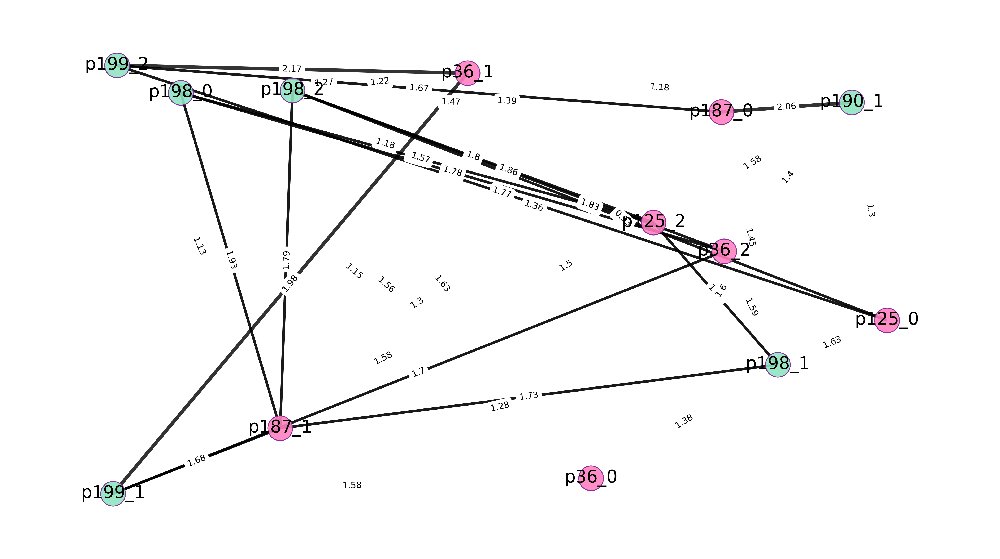

In [ ]:
# nodes
options = {"edgecolors": "xkcd:purple", "node_size": 800, "alpha": 0.9}
nx.draw_networkx_nodes(Gsavg1, pos, nodelist=[v[6:] for v in visual],
                       node_color="xkcd:light teal", **options)
nx.draw_networkx_nodes(Gsavg1, pos, nodelist=[m[6:] for m in mtl],
                       node_color="xkcd:pink", **options)

# edges
e_strong1 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if w["weight"] >= 2.81]
e_strong2 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 2.52) & (w["weight"] < 2.81)]
e_strong3 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 2.23) & (w["weight"] < 2.52)]
e_strong4 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 1.94) & (w["weight"] < 2.23)]
e_strong5 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 1.65) & (w["weight"] < 1.94)]
e_strong6 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] < 1.65)]

nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong1, width=7, alpha=0.3,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong2, width=6, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong3, width=5, alpha=0.7,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong4, width=4, alpha=0.8,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong5, width=3, alpha=0.9,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong6, width=0, alpha=0,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))

# node labels
nx.draw_networkx_labels(Gsavg1, pos, font_size=20, font_family="sans-serif")

# edge weight labels
edge_labels = nx.get_edge_attributes(Gsavg1, "weight")
nx.draw_networkx_edge_labels(Gsavg1, pos, edge_labels)

ax = plt.gca()
ax.margins(0.08)
plt.axis("off")
plt.tight_layout()
plt.show()

In [ ]:
v

'msc06_p190_1'

In [ ]:
# session 1 avged
Gsavg2 = nx.Graph()
time_steps = len(idx_mtl)

i = 2

for v in visual:
    for m in mtl:
        vis = s_avg1[v].iloc[idxlist[i]]
        medt = s_avg1[m].iloc[idx_mtl[i]]
        weight = round(correlate(medt, vis, 'valid').max(), ndigits=2)

        Gsavg2.add_edge(v[6:], m[6:], weight=weight)


In [ ]:
pos = nx.random_layout(Gsavg2, seed=2435)  # positions for all nodes - seed for reproducibility

KeyError: 'p199_1_voxel_53'

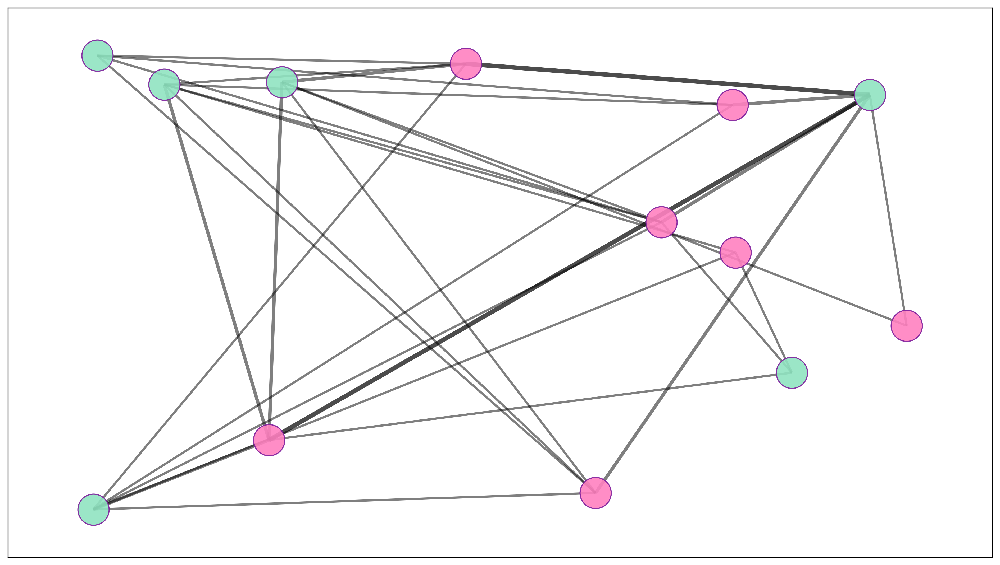

In [ ]:
# nodes
options = {"edgecolors": "xkcd:purple", "node_size": 800, "alpha": 0.9}
nx.draw_networkx_nodes(Gsavg2, pos, nodelist=[v[6:] for v in visual],
                       node_color="xkcd:light teal", **options)
nx.draw_networkx_nodes(Gsavg2, pos, nodelist=[m[6:] for m in mtl],
                       node_color="xkcd:pink", **options)

# edges
e_strong1 = [(v, m) for (v, m, w) in Gsavg2.edges(data=True) if w["weight"] >= 50]
e_strong2 = [(v, m) for (v, m, w) in Gsavg2.edges(data=True) if (w["weight"] >= 30) & (w["weight"] < 50)]
e_strong3 = [(v, m) for (v, m, w) in Gsavg2.edges(data=True) if (w["weight"] >= 10) & (w["weight"] < 30)]
# e_strong4 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 20) & (w["weight"] < 30)]
# e_strong5 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 10) & (w["weight"] < 20)]
e_strong6 = [(v, m) for (v, m, w) in Gs1.edges(data=True) if (w["weight"] >= 0) & (w["weight"] < 10)]

nx.draw_networkx_edges(Gsavg2, pos, edgelist=e_strong1, width=4, alpha=0.7,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg2, pos, edgelist=e_strong2, width=3, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg2, pos, edgelist=e_strong3, width=2, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
# nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong4, width=4, alpha=0.5,
#                        edge_cmap=sns.color_palette("mako", as_cmap=True))
# nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong5, width=1, alpha=0.5,
#                        edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg2, pos, edgelist=e_strong6, width=1, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))

# node labels
nx.draw_networkx_labels(Gsavg2, pos, font_size=20, font_family="sans-serif")

# edge weight labels
edge_labels = nx.get_edge_attributes(Gsavg2, "weight")
nx.draw_networkx_edge_labels(Gsavg2, pos, edge_labels)

ax = plt.gca()
ax.margins(0.08)
plt.axis("off")
plt.tight_layout()
plt.show()

In [ ]:
# session 1 avged
Gsavg5 = nx.Graph()
# time_steps = len(idx_mtl)

i = 5

for v in visual:
    for m in mtl:
        vis = s_avg1[v].iloc[idxlist[i]]
        medt = s_avg1[m].iloc[idx_mtl[i]]
        weight = round(correlate(medt, vis, 'valid').max(), ndigits=2)

        Gsavg5.add_edge(v[6:], m[6:], weight=weight)


In [ ]:
pos = nx.random_layout(Gsavg5, seed=2435)  # positions for all nodes - seed for reproducibility

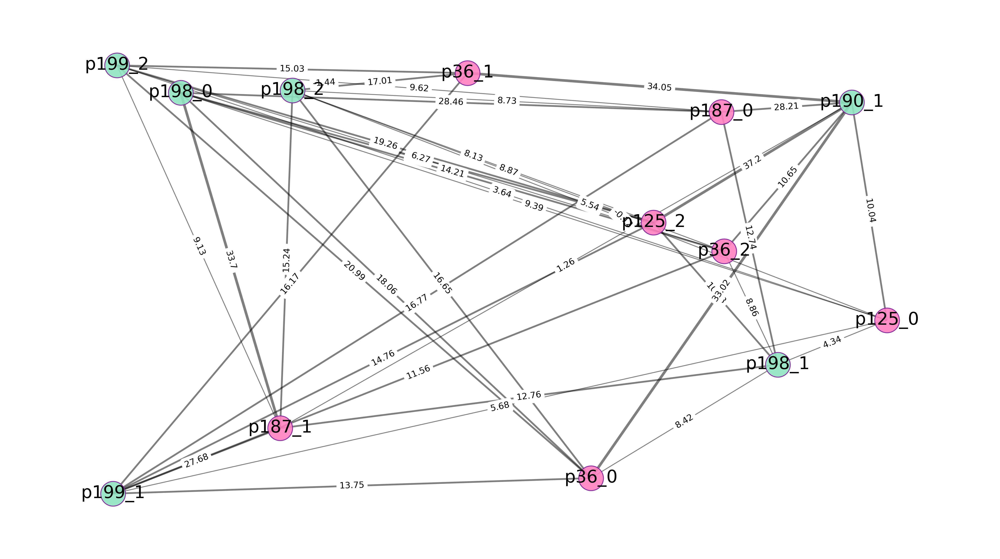

In [ ]:
# nodes
options = {"edgecolors": "xkcd:purple", "node_size": 800, "alpha": 0.9}
nx.draw_networkx_nodes(Gsavg5, pos, nodelist=[v[6:] for v in visual],
                       node_color="xkcd:light teal", **options)
nx.draw_networkx_nodes(Gsavg5, pos, nodelist=[m[6:] for m in mtl],
                       node_color="xkcd:pink", **options)

# edges
e_strong1 = [(v, m) for (v, m, w) in Gsavg5.edges(data=True) if w["weight"] >= 50]
e_strong2 = [(v, m) for (v, m, w) in Gsavg5.edges(data=True) if (w["weight"] >= 30) & (w["weight"] < 50)]
e_strong3 = [(v, m) for (v, m, w) in Gsavg5.edges(data=True) if (w["weight"] >= 10) & (w["weight"] < 30)]
# e_strong4 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 20) & (w["weight"] < 30)]
# e_strong5 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 10) & (w["weight"] < 20)]
e_strong6 = [(v, m) for (v, m, w) in Gsavg5.edges(data=True) if (w["weight"] >= 0) & (w["weight"] < 10)]

nx.draw_networkx_edges(Gsavg5, pos, edgelist=e_strong1, width=4, alpha=0.7,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg5, pos, edgelist=e_strong2, width=3, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg5, pos, edgelist=e_strong3, width=2, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
# nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong4, width=4, alpha=0.5,
#                        edge_cmap=sns.color_palette("mako", as_cmap=True))
# nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong5, width=1, alpha=0.5,
#                        edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg5, pos, edgelist=e_strong6, width=1, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))

# node labels
nx.draw_networkx_labels(Gsavg5, pos, font_size=20, font_family="sans-serif")

# edge weight labels
edge_labels = nx.get_edge_attributes(Gsavg5, "weight")
nx.draw_networkx_edge_labels(Gsavg5, pos, edge_labels)

ax = plt.gca()
ax.margins(0.08)
plt.axis("off")
plt.tight_layout()
plt.show()

In [ ]:
# session 1 avged
Gsavg10 = nx.Graph()
# time_steps = len(idx_mtl)

i = 10

for v in visual:
    for m in mtl:
        vis = s_avg1[v].iloc[idxlist[i]]
        medt = s_avg1[m].iloc[idx_mtl[i]]
        weight = round(correlate(medt, vis, 'valid').max(), ndigits=2)

        Gsavg10.add_edge(v[6:], m[6:], weight=weight)


In [ ]:
pos = nx.random_layout(Gsavg10, seed=2435)  # positions for all nodes - seed for reproducibility

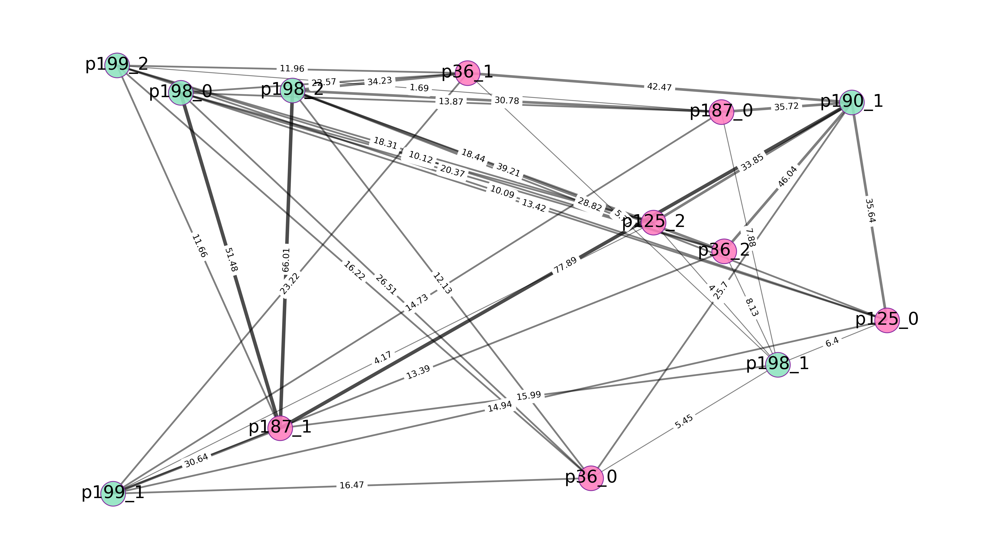

In [ ]:
# nodes
options = {"edgecolors": "xkcd:purple", "node_size": 800, "alpha": 0.9}
nx.draw_networkx_nodes(Gsavg10, pos, nodelist=[v[6:] for v in visual],
                       node_color="xkcd:light teal", **options)
nx.draw_networkx_nodes(Gsavg10, pos, nodelist=[m[6:] for m in mtl],
                       node_color="xkcd:pink", **options)

# edges
e_strong1 = [(v, m) for (v, m, w) in Gsavg10.edges(data=True) if w["weight"] >= 50]
e_strong2 = [(v, m) for (v, m, w) in Gsavg10.edges(data=True) if (w["weight"] >= 30) & (w["weight"] < 50)]
e_strong3 = [(v, m) for (v, m, w) in Gsavg10.edges(data=True) if (w["weight"] >= 10) & (w["weight"] < 30)]
# e_strong4 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 20) & (w["weight"] < 30)]
# e_strong5 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 10) & (w["weight"] < 20)]
e_strong6 = [(v, m) for (v, m, w) in Gsavg10.edges(data=True) if (w["weight"] >= 0) & (w["weight"] < 10)]

nx.draw_networkx_edges(Gsavg10, pos, edgelist=e_strong1, width=4, alpha=0.7,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg10, pos, edgelist=e_strong2, width=3, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg10, pos, edgelist=e_strong3, width=2, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
# nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong4, width=4, alpha=0.5,
#                        edge_cmap=sns.color_palette("mako", as_cmap=True))
# nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong5, width=1, alpha=0.5,
#                        edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg10, pos, edgelist=e_strong6, width=1, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))

# node labels
nx.draw_networkx_labels(Gsavg10, pos, font_size=20, font_family="sans-serif")

# edge weight labels
edge_labels = nx.get_edge_attributes(Gsavg10, "weight")
nx.draw_networkx_edge_labels(Gsavg10, pos, edge_labels)

ax = plt.gca()
ax.margins(0.08)
plt.axis("off")
plt.tight_layout()
plt.show()

In [ ]:
# session 1 avged
Gsavg20 = nx.Graph()
# time_steps = len(idx_mtl)

i = 20

for v in visual:
    for m in mtl:
        vis = s_avg1[v].iloc[idxlist[i]]
        medt = s_avg1[m].iloc[idx_mtl[i]]
        weight = round(correlate(medt, vis, 'valid').max(), ndigits=2)

        Gsavg20.add_edge(v[6:], m[6:], weight=weight)


In [ ]:
pos = nx.random_layout(Gsavg20, seed=2435)  # positions for all nodes - seed for reproducibility

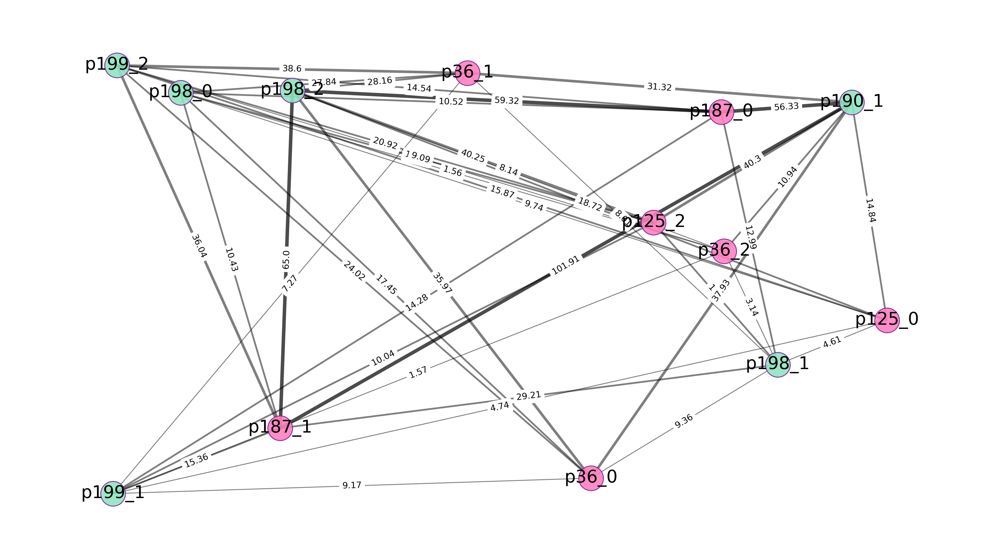

In [ ]:
# nodes
options = {"edgecolors": "xkcd:purple", "node_size": 800, "alpha": 0.9}
nx.draw_networkx_nodes(Gsavg20, pos, nodelist=[v[6:] for v in visual],
                       node_color="xkcd:light teal", **options)
nx.draw_networkx_nodes(Gsavg20, pos, nodelist=[m[6:] for m in mtl],
                       node_color="xkcd:pink", **options)

# edges
e_strong1 = [(v, m) for (v, m, w) in Gsavg20.edges(data=True) if w["weight"] >= 50]
e_strong2 = [(v, m) for (v, m, w) in Gsavg20.edges(data=True) if (w["weight"] >= 30) & (w["weight"] < 50)]
e_strong3 = [(v, m) for (v, m, w) in Gsavg20.edges(data=True) if (w["weight"] >= 10) & (w["weight"] < 30)]
# e_strong4 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 20) & (w["weight"] < 30)]
# e_strong5 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 10) & (w["weight"] < 20)]
e_strong6 = [(v, m) for (v, m, w) in Gsavg20.edges(data=True) if (w["weight"] >= 0) & (w["weight"] < 10)]

nx.draw_networkx_edges(Gsavg20, pos, edgelist=e_strong1, width=4, alpha=0.7,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg20, pos, edgelist=e_strong2, width=3, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg20, pos, edgelist=e_strong3, width=2, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
# nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong4, width=4, alpha=0.5,
#                        edge_cmap=sns.color_palette("mako", as_cmap=True))
# nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong5, width=1, alpha=0.5,
#                        edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg20, pos, edgelist=e_strong6, width=1, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))

# node labels
nx.draw_networkx_labels(Gsavg20, pos, font_size=20, font_family="sans-serif")

# edge weight labels
edge_labels = nx.get_edge_attributes(Gsavg20, "weight")
nx.draw_networkx_edge_labels(Gsavg20, pos, edge_labels)

ax = plt.gca()
ax.margins(0.08)
plt.axis("off")
plt.tight_layout()
plt.show()

In [ ]:
# session 1 avged
Gsavg50 = nx.Graph()
# time_steps = len(idx_mtl)

i = 50

for v in visual:
    for m in mtl:
        vis = s_avg1[v].iloc[idxlist[i]]
        medt = s_avg1[m].iloc[idx_mtl[i]]
        weight = round(correlate(medt, vis, 'valid').max(), ndigits=2)

        Gsavg50.add_edge(v[6:], m[6:], weight=weight)


In [ ]:
pos = nx.random_layout(Gsavg50, seed=2435)  # positions for all nodes - seed for reproducibility

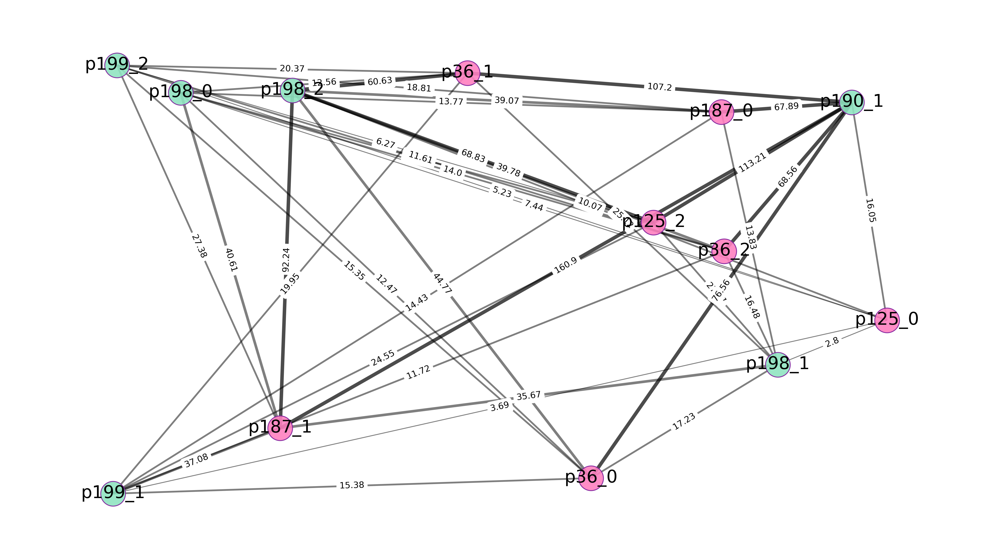

In [ ]:
# nodes
options = {"edgecolors": "xkcd:purple", "node_size": 800, "alpha": 0.9}
nx.draw_networkx_nodes(Gsavg50, pos, nodelist=[v[6:] for v in visual],
                       node_color="xkcd:light teal", **options)
nx.draw_networkx_nodes(Gsavg50, pos, nodelist=[m[6:] for m in mtl],
                       node_color="xkcd:pink", **options)

# edges
e_strong1 = [(v, m) for (v, m, w) in Gsavg50.edges(data=True) if w["weight"] >= 50]
e_strong2 = [(v, m) for (v, m, w) in Gsavg50.edges(data=True) if (w["weight"] >= 30) & (w["weight"] < 50)]
e_strong3 = [(v, m) for (v, m, w) in Gsavg50.edges(data=True) if (w["weight"] >= 10) & (w["weight"] < 30)]
# e_strong4 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 20) & (w["weight"] < 30)]
# e_strong5 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 10) & (w["weight"] < 20)]
e_strong6 = [(v, m) for (v, m, w) in Gsavg50.edges(data=True) if (w["weight"] >= 0) & (w["weight"] < 10)]

nx.draw_networkx_edges(Gsavg50, pos, edgelist=e_strong1, width=4, alpha=0.7,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg50, pos, edgelist=e_strong2, width=3, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg50, pos, edgelist=e_strong3, width=2, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
# nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong4, width=4, alpha=0.5,
#                        edge_cmap=sns.color_palette("mako", as_cmap=True))
# nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong5, width=1, alpha=0.5,
#                        edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg50, pos, edgelist=e_strong6, width=1, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))

# node labels
nx.draw_networkx_labels(Gsavg50, pos, font_size=20, font_family="sans-serif")

# edge weight labels
edge_labels = nx.get_edge_attributes(Gsavg50, "weight")
nx.draw_networkx_edge_labels(Gsavg50, pos, edge_labels)

ax = plt.gca()
ax.margins(0.08)
plt.axis("off")
plt.tight_layout()
plt.show()

In [ ]:
# session 1 avged
Gsavg100 = nx.Graph()
# time_steps = len(idx_mtl)

i = 100

for v in visual:
    for m in mtl:
        vis = s_avg1[v].iloc[idxlist[i]]
        medt = s_avg1[m].iloc[idx_mtl[i]]
        weight = round(correlate(medt, vis, 'valid').max(), ndigits=2)

        Gsavg100.add_edge(v[6:], m[6:], weight=weight)


In [ ]:
pos = nx.random_layout(Gsavg100, seed=2435)  # positions for all nodes - seed for reproducibility

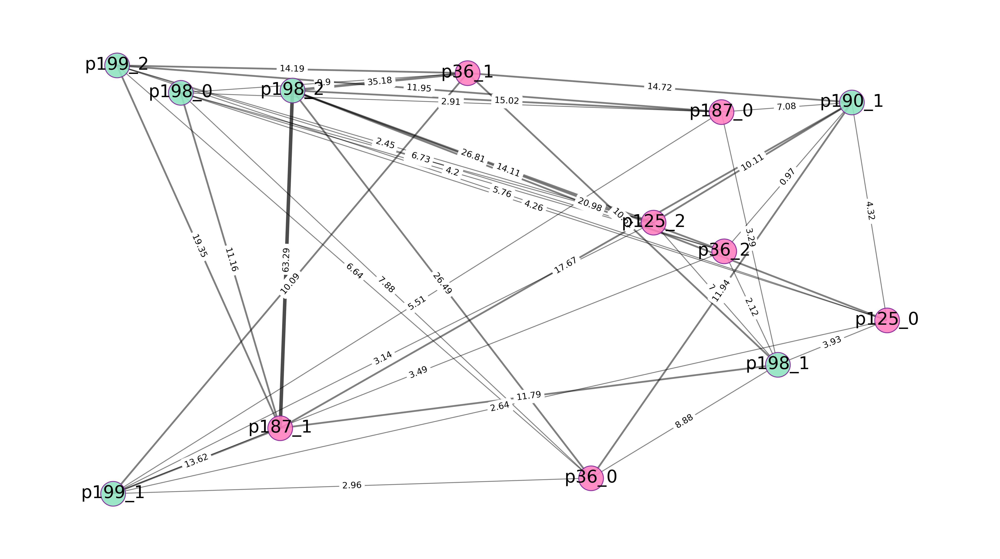

In [ ]:
# nodes
options = {"edgecolors": "xkcd:purple", "node_size": 800, "alpha": 0.9}
nx.draw_networkx_nodes(Gsavg100, pos, nodelist=[v[6:] for v in visual],
                       node_color="xkcd:light teal", **options)
nx.draw_networkx_nodes(Gsavg100, pos, nodelist=[m[6:] for m in mtl],
                       node_color="xkcd:pink", **options)

# edges
e_strong1 = [(v, m) for (v, m, w) in Gsavg100.edges(data=True) if w["weight"] >= 50]
e_strong2 = [(v, m) for (v, m, w) in Gsavg100.edges(data=True) if (w["weight"] >= 30) & (w["weight"] < 50)]
e_strong3 = [(v, m) for (v, m, w) in Gsavg100.edges(data=True) if (w["weight"] >= 10) & (w["weight"] < 30)]
# e_strong4 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 20) & (w["weight"] < 30)]
# e_strong5 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 10) & (w["weight"] < 20)]
e_strong6 = [(v, m) for (v, m, w) in Gsavg100.edges(data=True) if (w["weight"] >= 0) & (w["weight"] < 10)]

nx.draw_networkx_edges(Gsavg100, pos, edgelist=e_strong1, width=4, alpha=0.7,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg100, pos, edgelist=e_strong2, width=3, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg100, pos, edgelist=e_strong3, width=2, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
# nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong4, width=4, alpha=0.5,
#                        edge_cmap=sns.color_palette("mako", as_cmap=True))
# nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong5, width=1, alpha=0.5,
#                        edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg100, pos, edgelist=e_strong6, width=1, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))

# node labels
nx.draw_networkx_labels(Gsavg100, pos, font_size=20, font_family="sans-serif")

# edge weight labels
edge_labels = nx.get_edge_attributes(Gsavg100, "weight")
nx.draw_networkx_edge_labels(Gsavg100, pos, edge_labels)

ax = plt.gca()
ax.margins(0.08)
plt.axis("off")
plt.tight_layout()
plt.show()

In [ ]:
# session 2 avged
Gsavg1 = nx.Graph()
# time_steps = len(idx_mtl)

i = 1

for v in visual:
    for m in mtl:
        vis = s_avg2[v].iloc[idxlist[i]]
        medt = s_avg2[m].iloc[idx_mtl[i]]
        weight = round(correlate(medt, vis, 'valid').max(), ndigits=2)

        Gsavg1.add_edge(v[6:], m[6:], weight=weight)


In [ ]:
pos = nx.random_layout(Gsavg1, seed=2435)  # positions for all nodes - seed for reproducibility

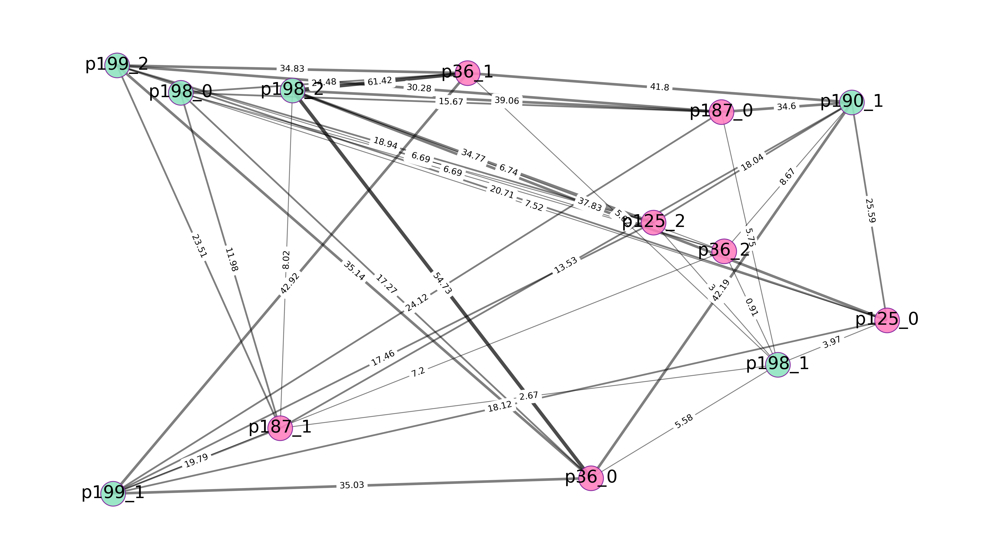

In [ ]:
# nodes
options = {"edgecolors": "xkcd:purple", "node_size": 800, "alpha": 0.9}
nx.draw_networkx_nodes(Gsavg1, pos, nodelist=[v[6:] for v in visual],
                       node_color="xkcd:light teal", **options)
nx.draw_networkx_nodes(Gsavg1, pos, nodelist=[m[6:] for m in mtl],
                       node_color="xkcd:pink", **options)

# edges
e_strong1 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if w["weight"] >= 50]
e_strong2 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 30) & (w["weight"] < 50)]
e_strong3 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 10) & (w["weight"] < 30)]
# e_strong4 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 20) & (w["weight"] < 30)]
# e_strong5 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 10) & (w["weight"] < 20)]
e_strong6 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 0) & (w["weight"] < 10)]

nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong1, width=4, alpha=0.7,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong2, width=3, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong3, width=2, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
# nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong4, width=4, alpha=0.5,
#                        edge_cmap=sns.color_palette("mako", as_cmap=True))
# nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong5, width=1, alpha=0.5,
#                        edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong6, width=1, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))

# node labels
nx.draw_networkx_labels(Gsavg1, pos, font_size=20, font_family="sans-serif")

# edge weight labels
edge_labels = nx.get_edge_attributes(Gsavg1, "weight")
nx.draw_networkx_edge_labels(Gsavg1, pos, edge_labels)

ax = plt.gca()
ax.margins(0.08)
plt.axis("off")
plt.tight_layout()
plt.show()

In [ ]:
# session 1 avged
Gsavg150 = nx.Graph()
# time_steps = len(idx_mtl)

i = 150

for v in visual:
    for m in mtl:
        vis = s_avg1[v].iloc[idxlist[i]]
        medt = s_avg1[m].iloc[idx_mtl[i]]
        weight = round(correlate(medt, vis, 'valid').max(), ndigits=2)

        Gsavg150.add_edge(v[6:], m[6:], weight=weight)


In [ ]:
pos = nx.random_layout(Gsavg150, seed=2435)  # positions for all nodes - seed for reproducibility

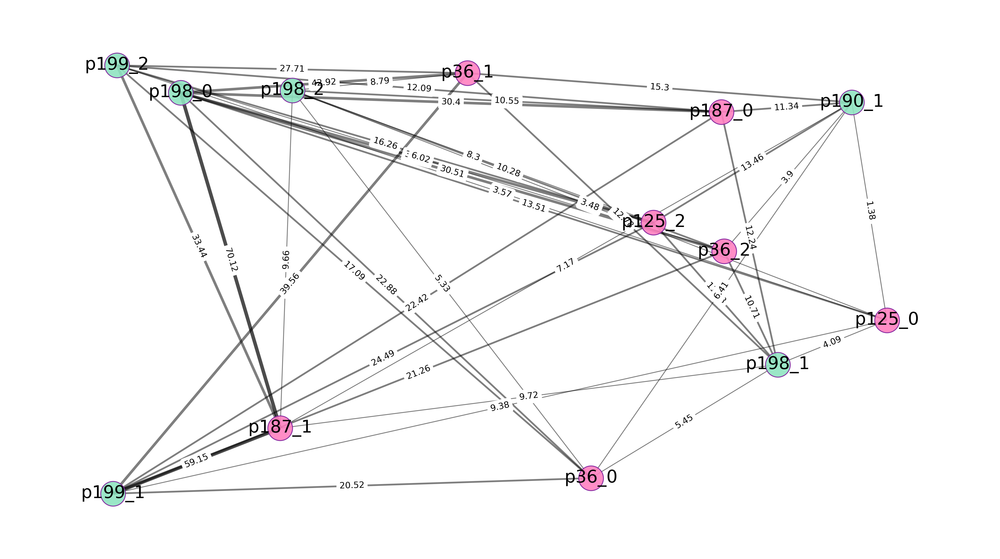

In [ ]:
# nodes
options = {"edgecolors": "xkcd:purple", "node_size": 800, "alpha": 0.9}
nx.draw_networkx_nodes(Gsavg150, pos, nodelist=[v[6:] for v in visual],
                       node_color="xkcd:light teal", **options)
nx.draw_networkx_nodes(Gsavg150, pos, nodelist=[m[6:] for m in mtl],
                       node_color="xkcd:pink", **options)

# edges
e_strong1 = [(v, m) for (v, m, w) in Gsavg150.edges(data=True) if w["weight"] >= 50]
e_strong2 = [(v, m) for (v, m, w) in Gsavg150.edges(data=True) if (w["weight"] >= 30) & (w["weight"] < 50)]
e_strong3 = [(v, m) for (v, m, w) in Gsavg150.edges(data=True) if (w["weight"] >= 10) & (w["weight"] < 30)]
# e_strong4 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 20) & (w["weight"] < 30)]
# e_strong5 = [(v, m) for (v, m, w) in Gsavg1.edges(data=True) if (w["weight"] >= 10) & (w["weight"] < 20)]
e_strong6 = [(v, m) for (v, m, w) in Gsavg150.edges(data=True) if (w["weight"] >= 0) & (w["weight"] < 10)]

nx.draw_networkx_edges(Gsavg150, pos, edgelist=e_strong1, width=4, alpha=0.7,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg150, pos, edgelist=e_strong2, width=3, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg150, pos, edgelist=e_strong3, width=2, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))
# nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong4, width=4, alpha=0.5,
#                        edge_cmap=sns.color_palette("mako", as_cmap=True))
# nx.draw_networkx_edges(Gsavg1, pos, edgelist=e_strong5, width=1, alpha=0.5,
#                        edge_cmap=sns.color_palette("mako", as_cmap=True))
nx.draw_networkx_edges(Gsavg150, pos, edgelist=e_strong6, width=1, alpha=0.5,
                       edge_cmap=sns.color_palette("mako", as_cmap=True))

# node labels
nx.draw_networkx_labels(Gsavg150, pos, font_size=20, font_family="sans-serif")

# edge weight labels
edge_labels = nx.get_edge_attributes(Gsavg150, "weight")
nx.draw_networkx_edge_labels(Gsavg150, pos, edge_labels)

ax = plt.gca()
ax.margins(0.08)
plt.axis("off")
plt.tight_layout()
plt.show()

In [ ]:
# some metrics
time_steps = len(idx_mtl)

edgedict = dict()

for i in range(time_steps):

    for v in visual:
        for m in mtl:
            vis = s_avg1[v].iloc[idxlist[i]]
            medt = s_avg1[m].iloc[idx_mtl[i]]
            weight = round(correlate(medt, vis, 'valid').max(), ndigits=2)
            kname = v[6:]+"->"+m[6:]

            if kname not in edgedict:
                edgedict[kname] = [weight]
            else:
                edgedict[kname].append(weight)

In [ ]:
# some metrics
time_steps = len(idx_mtl)

adjmat = np.zeros((time_steps, len(visual), len(mtl)))

for t in range(time_steps):

    for i, v in enumerate(visual):

        for j, m in enumerate(mtl):
            vis = s_avg1[v].iloc[idxlist[t]]
            medt = s_avg1[m].iloc[idx_mtl[t]]
            weight = round(correlate(medt, vis, 'valid').max(), ndigits=2)
            adjmat[t,i,j] = weight

In [ ]:
flat_adjmat = adjmat.flatten()

<Axes: ylabel='Density'>

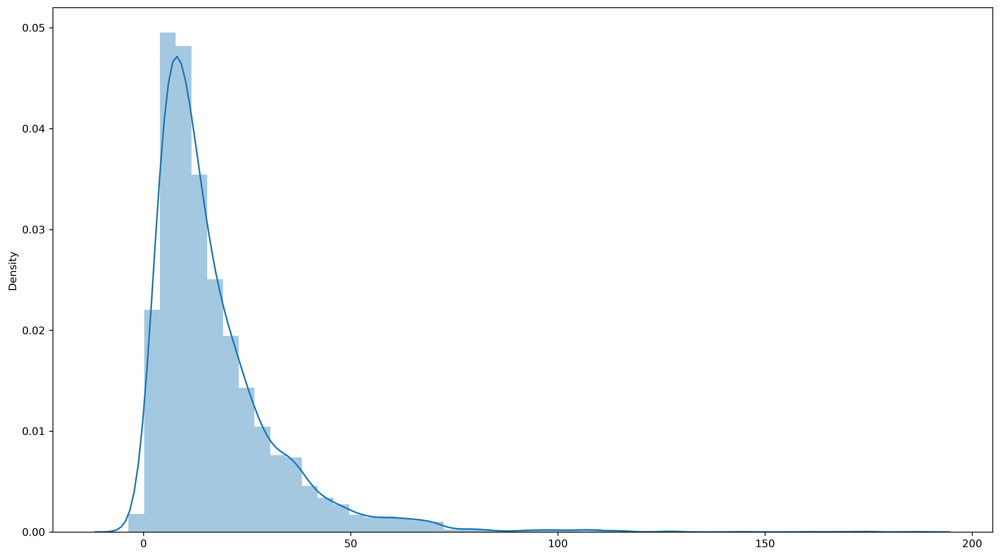

In [ ]:
sns.distplot(flat_adjmat)

In [ ]:
np.max(flat_adjmat)

186.65

In [ ]:
# ratio of values over 10
filter_adjmat = flat_adjmat[flat_adjmat>=10]
len(filter_adjmat)/len(flat_adjmat)

0.6103641456582634

Now let's try the highest crosscorrelation over the sum of all of the others. Ideally, other values in the vector should be much lower.

In [ ]:
# some metrics
#time_steps = len(idx_mtl)

adjmat_norm = np.zeros((time_steps, len(visual), len(mtl)))

for t in range(time_steps):

    for i, v in enumerate(visual):

        for j, m in enumerate(mtl):
            vis = s_avg1[v].iloc[idxlist[t]]
            medt = s_avg1[m].iloc[idx_mtl[t]]
            xcorv = correlate(medt, vis, 'valid')
            normer = np.sqrt(np.sum(vis**2) * np.sum(medt**2))
            xnormed = xcorv/normer
            weight = np.round(xnormed.max(), decimals=2)
            adjmat_norm[t,i,j] = weight

In [ ]:
flat_adjmat_n = adjmat_norm.flatten()

<Axes: ylabel='Density'>

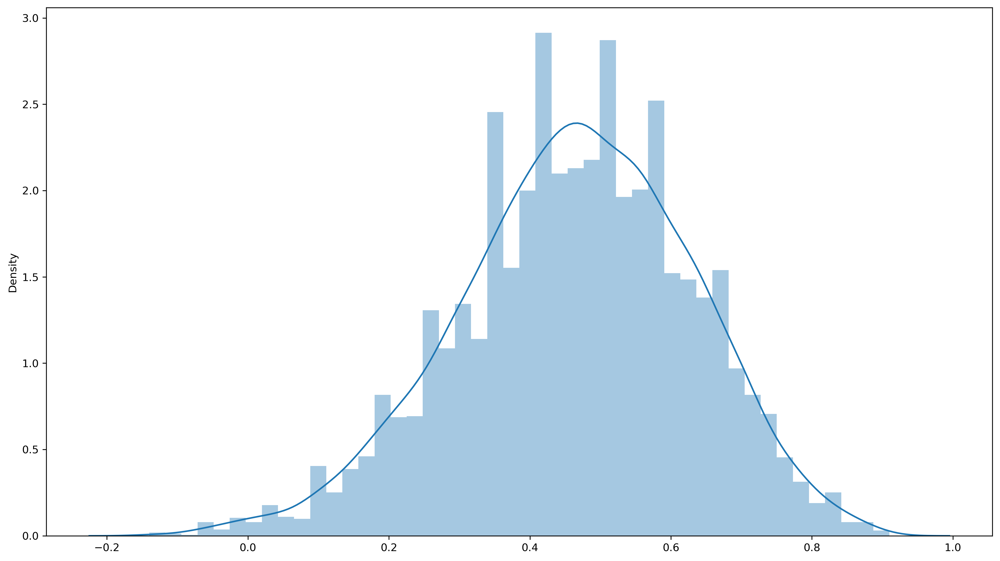

In [ ]:
sns.distplot(flat_adjmat_n)

In [ ]:
print(flat_adjmat_n.max(), flat_adjmat_n.min(), flat_adjmat_n.mean(), np.median(flat_adjmat_n), flat_adjmat_n.std())

0.91 -0.14 0.4634243697478992 0.47 0.16708682648667159


In [ ]:
# using z-scores
#time_steps = len(idx_mtl)

adjmat_norm = np.zeros((time_steps, len(visual), len(mtl)))

for t in range(time_steps):

    for i, v in enumerate(visual):

        for j, m in enumerate(mtl):
            vis = s_avg1[v].iloc[idxlist[t]]
            medt = s_avg1[m].iloc[idx_mtl[t]]
            xcorv = correlate(medt, vis, 'valid')
            xnormed = (xcorv-xcorv.mean())/xcorv.std()
            weight = np.round(xnormed.max(), decimals=2)
            adjmat_norm[t,i,j] = weight

In [ ]:
flat_adjmat_n = adjmat_norm.flatten()

<Axes: ylabel='Density'>

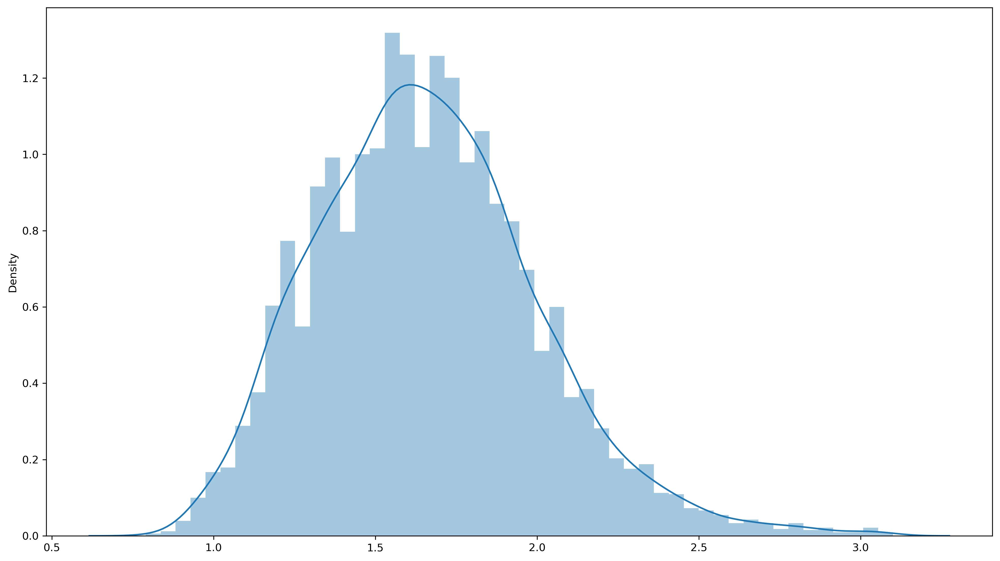

In [ ]:
sns.distplot(flat_adjmat_n)

In [ ]:
print(flat_adjmat_n.max(), flat_adjmat_n.min(), flat_adjmat_n.mean(), np.median(flat_adjmat_n), flat_adjmat_n.std())

3.1 0.79 1.6606330532212885 1.64 0.34241655193921094


In [ ]:
# ratio of values over 1.65
filter_adjmat_n = flat_adjmat_n[flat_adjmat_n>=1.66]
len(filter_adjmat_n)/len(flat_adjmat_n)

0.484593837535014

Let's look at edge changes over time. We have weighted edges so let's look at degree and summed weight over time.

In [ ]:
adjmat_deg = adjmat_norm>1.65

In [ ]:
degmat = np.zeros((6,170))
for v in range(len(visual)):
    degmat[v,:] = adjmat_deg[:,v,:].sum(axis=1)

In [ ]:
fig, ax = plt.subplots(2,3)
sns.lineplot(degmat[0,:], ax=ax[0,0], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(degmat[1,:], ax=ax[0,1], palette=sns.cubehelix_palette(start=np.random.uniform(1,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(degmat[2,:], ax=ax[0,2], palette=sns.cubehelix_palette(start=np.random.uniform(2,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(degmat[3,:], ax=ax[1,0], palette=sns.cubehelix_palette(start=np.random.uniform(3,7),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(degmat[4,:], ax=ax[1,1], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(degmat[5,:], ax=ax[1,2], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

In [ ]:
wmat = np.zeros((6,170))
for v in range(len(visual)):
    wmat[v,:] = adjmat_norm[:,v,:].sum(axis=1)

In [ ]:
fig, ax = plt.subplots(2,3)
sns.lineplot(wmat[0,:], ax=ax[0,0], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(wmat[1,:], ax=ax[0,1], palette=sns.cubehelix_palette(start=np.random.uniform(1,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(wmat[2,:], ax=ax[0,2], palette=sns.cubehelix_palette(start=np.random.uniform(2,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(wmat[3,:], ax=ax[1,0], palette=sns.cubehelix_palette(start=np.random.uniform(3,7),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(wmat[4,:], ax=ax[1,1], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(wmat[5,:], ax=ax[1,2], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

In [ ]:
degmat = (degmat-degmat.mean(axis=1).reshape(-1,1))/degmat.std(axis=1).reshape(-1,1)

In [ ]:
wmat = (wmat-wmat.mean(axis=1).reshape(-1,1))/wmat.std(axis=1).reshape(-1,1)

In [ ]:
fig, ax = plt.subplots(2,3)
sns.lineplot(wmat[0,:], ax=ax[0,0], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(wmat[1,:], ax=ax[0,1], palette=sns.cubehelix_palette(start=np.random.uniform(1,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(wmat[2,:], ax=ax[0,2], palette=sns.cubehelix_palette(start=np.random.uniform(2,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(wmat[3,:], ax=ax[1,0], palette=sns.cubehelix_palette(start=np.random.uniform(3,7),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(wmat[4,:], ax=ax[1,1], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(wmat[5,:], ax=ax[1,2], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(degmat[0,:], ax=ax[0,0], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(degmat[1,:], ax=ax[0,1], palette=sns.cubehelix_palette(start=np.random.uniform(1,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(degmat[2,:], ax=ax[0,2], palette=sns.cubehelix_palette(start=np.random.uniform(2,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(degmat[3,:], ax=ax[1,0], palette=sns.cubehelix_palette(start=np.random.uniform(3,7),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(degmat[4,:], ax=ax[1,1], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(degmat[5,:], ax=ax[1,2], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

In [ ]:
fig, ax = plt.subplots(2,1)
sns.lineplot(wmat[0,:], ax=ax[0], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(wmat[1,:], ax=ax[0], palette=sns.cubehelix_palette(start=np.random.uniform(1,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(wmat[2,:], ax=ax[1], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(wmat[3,:], ax=ax[1], palette=sns.cubehelix_palette(start=np.random.uniform(1,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(wmat[4,:], ax=ax[1], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))


<Axes: >

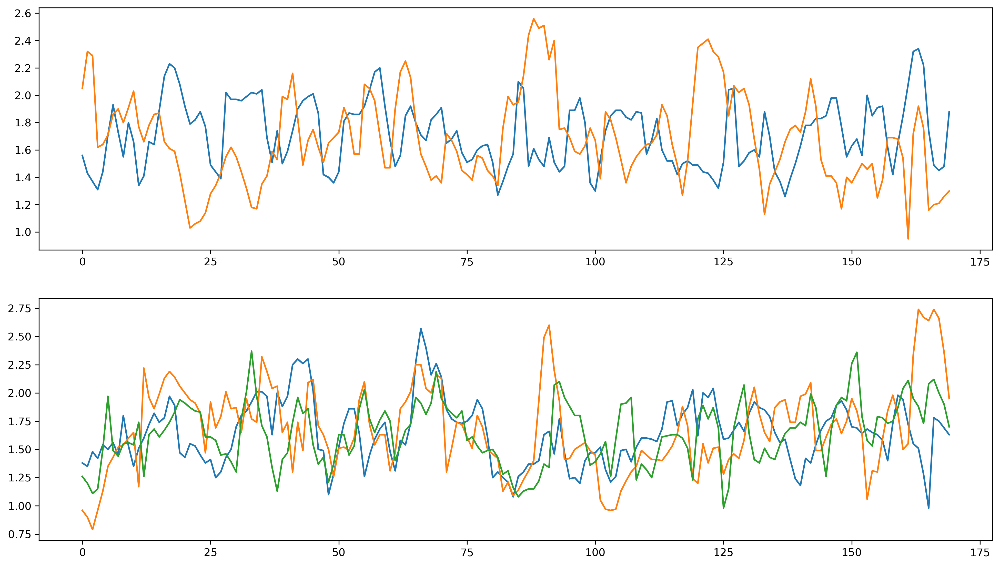

In [ ]:
fig, ax = plt.subplots(2,1)
# with 187_0
sns.lineplot(adjmat_norm[:,0,0], ax=ax[0], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(adjmat_norm[:,1,0], ax=ax[0], palette=sns.cubehelix_palette(start=np.random.uniform(1,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(adjmat_norm[:,2,0], ax=ax[1], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(adjmat_norm[:,3,0], ax=ax[1], palette=sns.cubehelix_palette(start=np.random.uniform(1,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(adjmat_norm[:,4,0], ax=ax[1], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))


<Axes: >

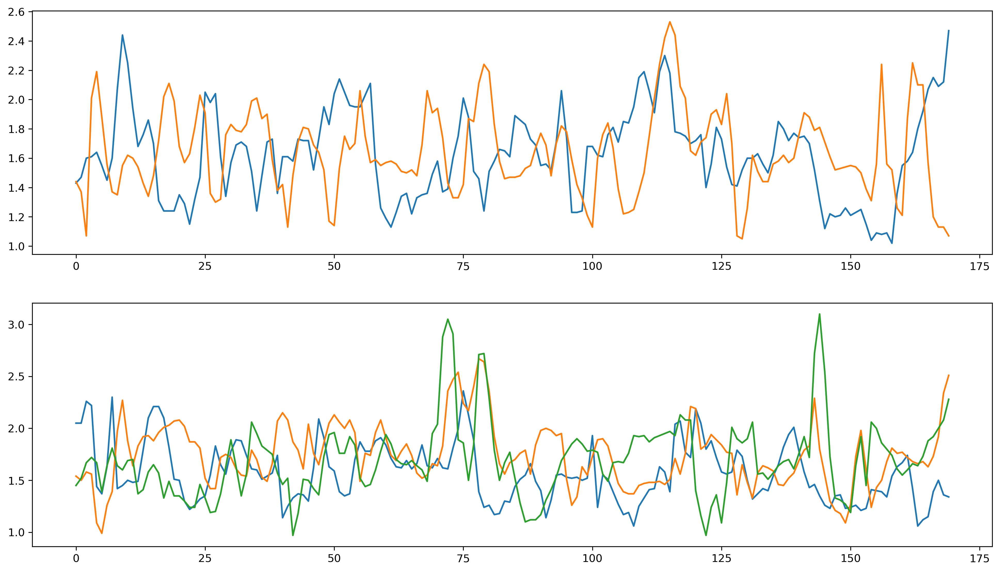

In [ ]:
fig, ax = plt.subplots(2,1)
# with 187_1
sns.lineplot(adjmat_norm[:,0,1], ax=ax[0], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(adjmat_norm[:,1,1], ax=ax[0], palette=sns.cubehelix_palette(start=np.random.uniform(1,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(adjmat_norm[:,2,1], ax=ax[1], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(adjmat_norm[:,3,1], ax=ax[1], palette=sns.cubehelix_palette(start=np.random.uniform(1,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(adjmat_norm[:,4,1], ax=ax[1], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))


<Axes: >

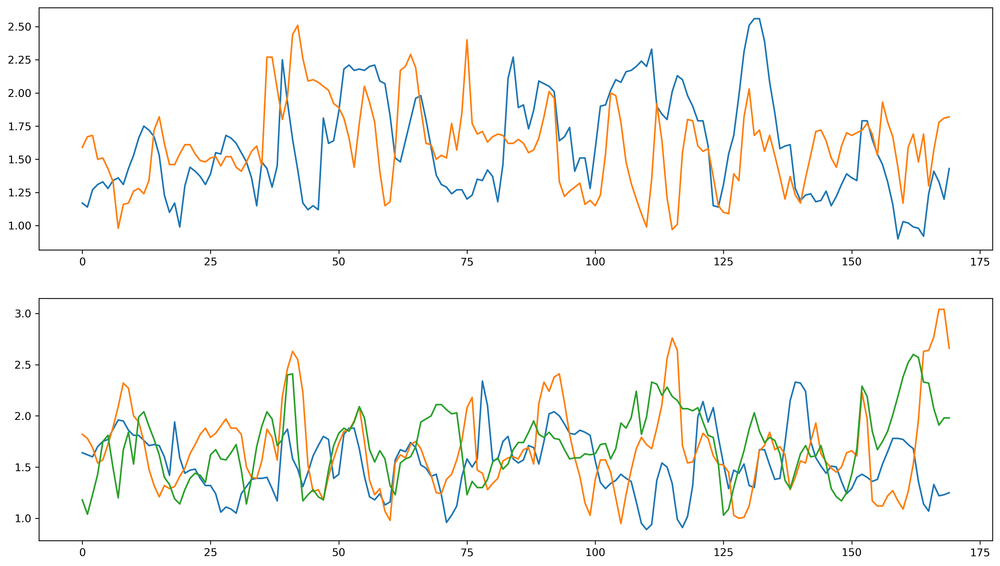

In [ ]:
fig, ax = plt.subplots(2,1)
# with 36_0
sns.lineplot(adjmat_norm[:,0,4], ax=ax[0], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(adjmat_norm[:,1,4], ax=ax[0], palette=sns.cubehelix_palette(start=np.random.uniform(1,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(adjmat_norm[:,2,4], ax=ax[1], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(adjmat_norm[:,3,4], ax=ax[1], palette=sns.cubehelix_palette(start=np.random.uniform(1,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))

sns.lineplot(adjmat_norm[:,4,4], ax=ax[1], palette=sns.cubehelix_palette(start=np.random.uniform(0,3),
                                                          rot=np.random.uniform(-1,1),
                                                          as_cmap=True))


In [ ]:
print(mtl)

['msc06_p187_0', 'msc06_p187_1', 'msc06_p125_0', 'msc06_p125_2', 'msc06_p36_0', 'msc06_p36_1', 'msc06_p36_2']


<Axes: >

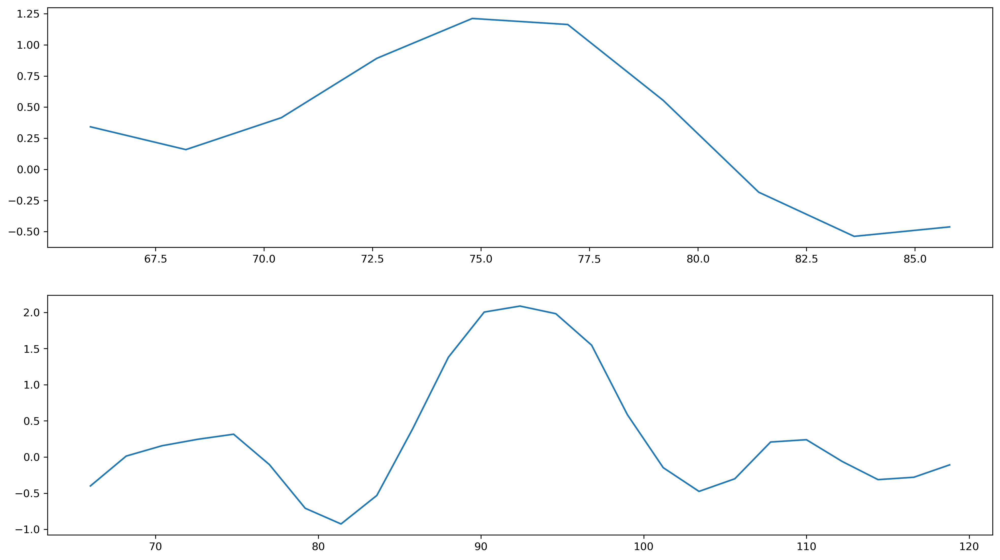

In [ ]:
fig, ax = plt.subplots(2,1)
sns.lineplot(vis, ax=ax[0], palette=sns.cubehelix_palette(
    start=np.random.uniform(0,3),
    rot=np.random.uniform(-1,1),
    as_cmap=True))
sns.lineplot(medt, ax=ax[1], palette=sns.cubehelix_palette(
    start=np.random.uniform(2,3),
    rot=np.random.uniform(-1,1),
    as_cmap=True))

In [ ]:
v, m

('msc06_p190_1', 'msc06_p36_2')

In [ ]:
for v in vis_v:
    nbrs = nx.neighbors(Gs1, v[6:])
    print(v, nbrs)

msc06_p199_1_voxel_53 <dict_keyiterator object at 0x00000286138A6250>
msc06_p199_1_voxel_37 <dict_keyiterator object at 0x00000286138A7C40>
msc06_p199_1_voxel_67 <dict_keyiterator object at 0x00000286138A6250>
msc06_p199_1_voxel_126 <dict_keyiterator object at 0x00000286138A7740>
msc06_p199_1_voxel_127 <dict_keyiterator object at 0x00000286138A7C40>
msc06_p199_1_voxel_51 <dict_keyiterator object at 0x00000286138A7740>
msc06_p199_2_voxel_92 <dict_keyiterator object at 0x00000286138A7C40>
msc06_p199_2_voxel_1 <dict_keyiterator object at 0x00000286138A7740>
msc06_p199_2_voxel_118 <dict_keyiterator object at 0x00000286138A6250>
msc06_p199_2_voxel_103 <dict_keyiterator object at 0x00000286138A7C40>
msc06_p199_2_voxel_113 <dict_keyiterator object at 0x00000286138A7740>
msc06_p199_2_voxel_108 <dict_keyiterator object at 0x00000286138A6250>
msc06_p198_0_voxel_90 <dict_keyiterator object at 0x00000286138A7740>
msc06_p198_0_voxel_45 <dict_keyiterator object at 0x00000286138A6250>
msc06_p198_0_vo

In [ ]:
time_steps

170

In [ ]:
mxv = correlate(medt, vis, 'valid')
lags = correlation_lags(25,10, 'valid')

In [ ]:
# session 1 avged
sdct = {}
time_steps = len(idx_mtl)

for i in range(time_steps):
    sdct["lag_"+str(i)]={}
    for v in visual:
        for m in mtl:

            if v[6:] not in sdct["lag_"+str(i)].keys():
                sdct["lag_"+str(i)][v[6:]]=[]

            vis = s_avg2[v].iloc[idxlist[i]]
            medt = s_avg2[m].iloc[idx_mtl[i]]
            weight = round(correlate(medt, vis, 'valid').max(), ndigits=2)

            sdct["lag_"+str(i)][v[6:]].append([m[6:], weight])

In [ ]:
v2m_all = {}
for v in visual:
    for m in mtl:
        v2m = []
        for i in range(time_steps):
            c = sdct["lag_"+str(i)]
            for r in c[v[6:]]:
                if r[0]==m[6:]:
                    v2m.append(r[1])
#         print(len(v2m))
        v2m_all[v+"_"+m] = v2m
        fig, ax = plt.subplots()
        sns.lineplot(v2m, ax=ax,
                     palette=sns.cubehelix_palette(
                         start=np.random.uniform(0,3),
                         rot=np.random.uniform(-1,1),
                         as_cmap=True))
        ax.set_xlabel("Time Steps (2.2 s)")
        ax.set_ylabel("Cross Correlation, %s -> %s" % (v,m))
        fig.savefig("./figs/"+v+"_"+m+"_corrxtime_msc06s2.jpg")

In [ ]:
vmdf = pd.DataFrame.from_dict(v2m_all)
vmdf.to_csv("./vmdf_msc06_s1.csv")

In [ ]:
lagged = []
corred = []

for _ in range(time_steps):
    for v in vis_v:
        for m in mtl_v:

            vis = vdf1[v].iloc[idxlist[i]]
            medt = vdf1[m].iloc[idx_mtl[i]]
            mxv = correlate(medt, vis, 'valid')
            lags = correlation_lags(25,10, 'valid')
            lagged.append(lags[np.argmax(mxv)])
            corred.append(mxv.max())


In [ ]:
sns.boxplot(corred)

In [ ]:
len(corred)

257040

In [ ]:
# session 1
s1_d = {}
constrained_time = vdf1.index[20:190]
for v in vis_v:
    for m in mtl_v:
        print(v,m)
        vis = vdf1.loc[constrained_time, v]
        medt = vdf1.loc[constrained_time[0]:, m]
        s1_d["_".join([v, m])] = correlate(medt, vis, 'valid')
        print(len(correlate(vis, medt, 'valid')))

msc06_p199_1_voxel_53 msc06_p187_0_voxel_111
174
msc06_p199_1_voxel_53 msc06_p187_0_voxel_102
174
msc06_p199_1_voxel_53 msc06_p187_0_voxel_71
174
msc06_p199_1_voxel_53 msc06_p187_0_voxel_74
174
msc06_p199_1_voxel_53 msc06_p187_0_voxel_112
174
msc06_p199_1_voxel_53 msc06_p187_0_voxel_69
174
msc06_p199_1_voxel_53 msc06_p187_1_voxel_83
174
msc06_p199_1_voxel_53 msc06_p187_1_voxel_128
174
msc06_p199_1_voxel_53 msc06_p187_1_voxel_129
174
msc06_p199_1_voxel_53 msc06_p187_1_voxel_80
174
msc06_p199_1_voxel_53 msc06_p187_1_voxel_81
174
msc06_p199_1_voxel_53 msc06_p187_1_voxel_82
174
msc06_p199_1_voxel_53 msc06_p125_0_voxel_108
174
msc06_p199_1_voxel_53 msc06_p125_0_voxel_70
174
msc06_p199_1_voxel_53 msc06_p125_0_voxel_63
174
msc06_p199_1_voxel_53 msc06_p125_0_voxel_116
174
msc06_p199_1_voxel_53 msc06_p125_0_voxel_71
174
msc06_p199_1_voxel_53 msc06_p125_0_voxel_64
174
msc06_p199_1_voxel_53 msc06_p125_2_voxel_124
174
msc06_p199_1_voxel_53 msc06_p125_2_voxel_130
174
msc06_p199_1_voxel_53 msc06_p12

174
msc06_p198_1_voxel_35 msc06_p125_2_voxel_85
174
msc06_p198_1_voxel_35 msc06_p36_0_voxel_60
174
msc06_p198_1_voxel_35 msc06_p36_0_voxel_87
174
msc06_p198_1_voxel_35 msc06_p36_0_voxel_118
174
msc06_p198_1_voxel_35 msc06_p36_0_voxel_59
174
msc06_p198_1_voxel_35 msc06_p36_0_voxel_180
174
msc06_p198_1_voxel_35 msc06_p36_0_voxel_161
174
msc06_p198_1_voxel_35 msc06_p36_1_voxel_91
174
msc06_p198_1_voxel_35 msc06_p36_1_voxel_112
174
msc06_p198_1_voxel_35 msc06_p36_1_voxel_66
174
msc06_p198_1_voxel_35 msc06_p36_1_voxel_114
174
msc06_p198_1_voxel_35 msc06_p36_1_voxel_111
174
msc06_p198_1_voxel_35 msc06_p36_1_voxel_177
174
msc06_p198_1_voxel_35 msc06_p36_2_voxel_31
174
msc06_p198_1_voxel_35 msc06_p36_2_voxel_20
174
msc06_p198_1_voxel_35 msc06_p36_2_voxel_13
174
msc06_p198_1_voxel_35 msc06_p36_2_voxel_15
174
msc06_p198_1_voxel_35 msc06_p36_2_voxel_30
174
msc06_p198_1_voxel_35 msc06_p36_2_voxel_9
174
msc06_p198_1_voxel_15 msc06_p187_0_voxel_111
174
msc06_p198_1_voxel_15 msc06_p187_0_voxel_102
17

In [ ]:
vis.max()


12.7315816879272

In [ ]:
lags = correlation_lags(medt.shape[0],vis.shape[0])

In [ ]:
len(lags)

512

In [ ]:
# session 1
s1_d = {}
constrained_time = vdf1.index[20:190]
for v in vis_v:
    for m in mtl_v:

        vis = vdf1.loc[constrained_time[0]:constrained_time[1], vis_v]
        medt = vdf1.loc[constrained_time[0]:, medt]

        for i in range(vis.shape[0]-9):

            if vis not in s1_d.keys():
               sd_1[] {s1_d[vis+"_timestep_"+str(i)] = [[mtl, ]]}

        maxdict = pd.DataFrame({"s1":s1.max(), "s2":s2.max()})
        big = maxdict.max().max()
        mindict = pd.DataFrame({"s1":s1.min(), "s2":s2.min()})
        small = mindict.min().min()

        s1 = (s1-small)/(big-small)
        s2 = (s2-small)/(big-small)

        lag1 = []
        lag2 = []
        for i in range(s1.shape[1]):
            for j in range(s1.shape[1]):
                if i==j:
                    continue
                xcor1 = correlate(s1.iloc[:,i],s1.iloc[:,j])
                xcor2 = correlate(s2.iloc[:,i],s2.iloc[:,j])
                lags = correlation_lags(s1.iloc[:,i].shape[0],s1.iloc[:,i].shape[0])
                lag1.append(lags[np.argmax(xcor1)])
                lag2.append(lags[np.argmax(xcor2)])
        print(k, max(lag1), max(lag2))

msc06_p199_1 0 2
msc06_p199_2 0 1
msc06_p198_0 0 0
msc06_p198_1 0 0
msc06_p198_2 0 0
msc06_p190_1 0 0
msc06_p187_0 5 0
msc06_p187_1 0 0
msc06_p125_0 1 1
msc06_p125_2 0 0
msc06_p36_0 1 0
msc06_p36_1 0 0
msc06_p36_2 2 3


In [ ]:
# session 1
s1_d = {}
constrained_time = vdf1.index[20:190]
for v in vis_v:
    for m in mtl_v:

        vis = vdf1.loc[constrained_time[0]:constrained_time[1], vis_v]
        medt = vdf1.loc[constrained_time[0]:, medt]

        for i in range(vis.shape[0]-9):

            if vis not in s1_d.keys():
               sd_1[] {s1_d[vis+"_timestep_"+str(i)] = [[mtl, ]]}

        maxdict = pd.DataFrame({"s1":s1.max(), "s2":s2.max()})
        big = maxdict.max().max()
        mindict = pd.DataFrame({"s1":s1.min(), "s2":s2.min()})
        small = mindict.min().min()

        s1 = (s1-small)/(big-small)
        s2 = (s2-small)/(big-small)

        lag1 = []
        lag2 = []
        for i in range(s1.shape[1]):
            for j in range(s1.shape[1]):
                if i==j:
                    continue
                xcor1 = correlate(s1.iloc[:,i],s1.iloc[:,j])
                xcor2 = correlate(s2.iloc[:,i],s2.iloc[:,j])
                lags = correlation_lags(s1.iloc[:,i].shape[0],s1.iloc[:,i].shape[0])
                lag1.append(lags[np.argmax(xcor1)])
                lag2.append(lags[np.argmax(xcor2)])
        print(k, max(lag1), max(lag2))

SyntaxError: invalid syntax (3483112766.py, line 13)

In [ ]:
correlate(vdf1['msc06_p199_1_voxel_53'],vdf1['msc06_p199_1_voxel_30']).shape

(725,)

In [ ]:
x = np.r_[-1:1:0.1]
# First signal
sig1 = np.sin(x)

# Seconds signal with pi/4 phase shift. Half the size of sig1
sig2 = np.sin(np.r_[-1:0:0.1] + np.pi/4)

print(len(sig1), len(sig2))

20 10


In [ ]:
fig, ax = plt.subplots(1,1)
ax.scatter(x=x, y=sig1, color="red")
ax.scatter(x=x + np.pi/4, y=sig2, color="blue")

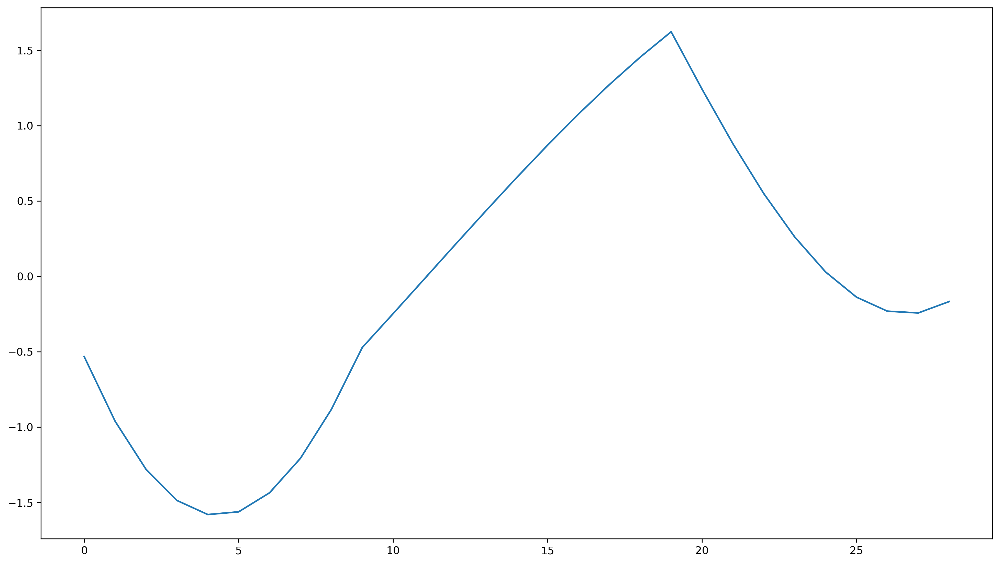

In [ ]:
plt.plot(correlate(sig1, sig2, "full"))

In [ ]:
lx = correlation_lags(len(sig1),len(sig2))
lx

array([-9, -8, -7, -6, -5, -4, -3, -2, -1,  0,  1,  2,  3,  4,  5,  6,  7,
        8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19])

In [ ]:
import graphviz

ModuleNotFoundError: No module named 'graphviz'